In [1]:
!pip install opencv-python matplotlib numpy pandas


In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [3]:
!kaggle datasets download -d akhatova/pcb-defects
!unzip pcb-defects.zip


Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
 99% 1.87G/1.88G [00:45<00:00, 18.4MB/s]
100% 1.88G/1.88G [00:45<00:00, 44.2MB/s]
Archive:  pcb-defects.zip
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_01.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_02.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_03.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_04.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_05.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_06.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_07.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_08.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_09.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_missing_hole_10.xml  
  inflating: PCB_DATASET/Annotations/Missing_hole/01_mis

In [4]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


In [5]:
for root, dirs, files in os.walk(".", topdown=True):
    print(root)
    break


.


In [6]:
for root, dirs, files in os.walk(".", topdown=True):
    print(os.listdir("images"))
    break



FileNotFoundError: [Errno 2] No such file or directory: 'images'

In [7]:
import os
print(os.listdir())


['.config', 'kaggle.json', 'pcb-defects.zip', 'PCB_DATASET', 'sample_data']


In [8]:
import os

print(os.listdir("PCB_DATASET"))


['Annotations', 'PCB_USED', 'images', 'rotate.py', 'rotation']


In [9]:
print(os.listdir("PCB_DATASET/images")[:5])


['Open_circuit', 'Missing_hole', 'Mouse_bite', 'Short', 'Spur']


In [10]:
print(os.listdir("PCB_DATASET/Annotations")[:5])


['Open_circuit', 'Missing_hole', 'Mouse_bite', 'Short', 'Spur']


In [11]:
import os

class_name = "Missing_hole"

image_folder = f"PCB_DATASET/images/{class_name}"
annotation_folder = f"PCB_DATASET/Annotations/{class_name}"

print("Images:", os.listdir(image_folder)[:5])
print("Annotations:", os.listdir(annotation_folder)[:5])


Images: ['01_missing_hole_03.jpg', '07_missing_hole_09.jpg', '09_missing_hole_08.jpg', '04_missing_hole_04.jpg', '06_missing_hole_04.jpg']
Annotations: ['09_missing_hole_06.xml', '12_missing_hole_02.xml', '06_missing_hole_01.xml', '04_missing_hole_04.xml', '06_missing_hole_10.xml']


Sample image: 12_missing_hole_07.jpg


(np.float64(-0.5), np.float64(2528.5), np.float64(2529.5), np.float64(-0.5))

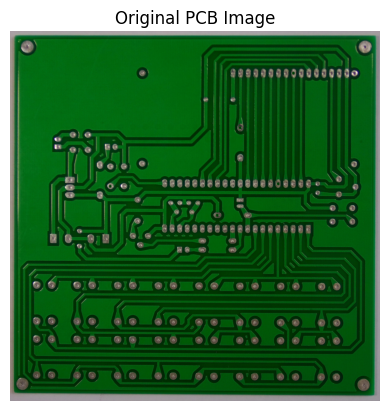

In [12]:
import random
import cv2
import matplotlib.pyplot as plt

image_files = os.listdir(image_folder)
sample_image = random.choice(image_files)

print("Sample image:", sample_image)

img_path = os.path.join(image_folder, sample_image)
img = cv2.imread(img_path)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original PCB Image")
plt.axis("off")


In [13]:
import xml.etree.ElementTree as ET

xml_file = sample_image.replace(".jpg", ".xml")
xml_path = os.path.join(annotation_folder, xml_file)

tree = ET.parse(xml_path)
root = tree.getroot()

for obj in root.findall("object"):
    defect_name = obj.find("name").text
    bbox = obj.find("bndbox")

    xmin = int(bbox.find("xmin").text)
    ymin = int(bbox.find("ymin").text)
    xmax = int(bbox.find("xmax").text)
    ymax = int(bbox.find("ymax").text)

    print("Defect:", defect_name)
    print("Box:", xmin, ymin, xmax, ymax)


Defect: missing_hole
Box: 1546 628 1607 694
Defect: missing_hole
Box: 1805 1013 1862 1079
Defect: missing_hole
Box: 1386 1233 1450 1289
Defect: missing_hole
Box: 662 1034 717 1092
Defect: missing_hole
Box: 1911 255 1965 319


(np.float64(-0.5), np.float64(2528.5), np.float64(2529.5), np.float64(-0.5))

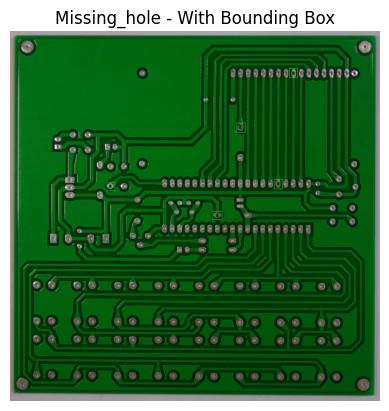

In [14]:
for obj in root.findall("object"):
    bbox = obj.find("bndbox")

    xmin = int(bbox.find("xmin").text)
    ymin = int(bbox.find("ymin").text)
    xmax = int(bbox.find("xmax").text)
    ymax = int(bbox.find("ymax").text)

    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title(f"{class_name} - With Bounding Box")
plt.axis("off")



Showing samples from class: Open_circuit


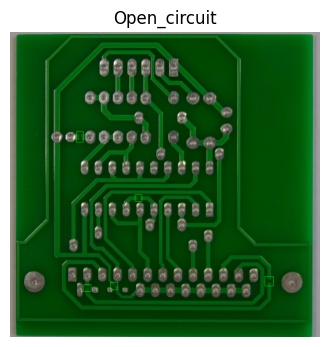

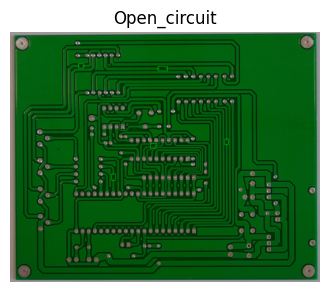


Showing samples from class: Missing_hole


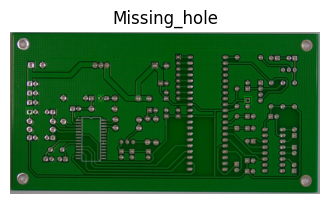

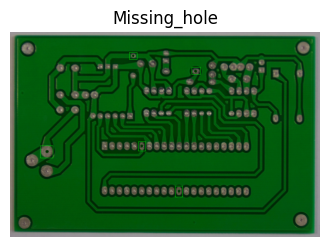


Showing samples from class: Mouse_bite


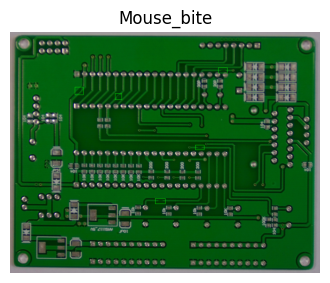

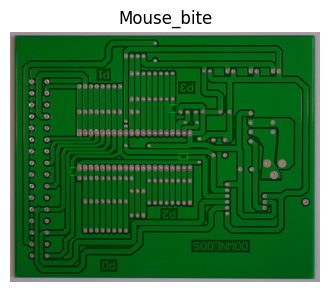


Showing samples from class: Short


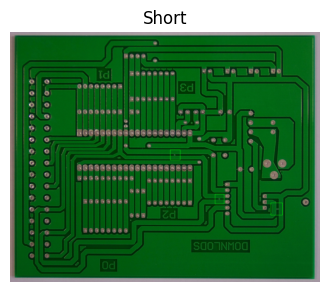

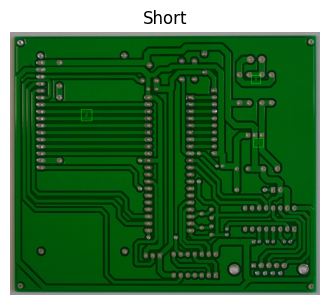


Showing samples from class: Spur


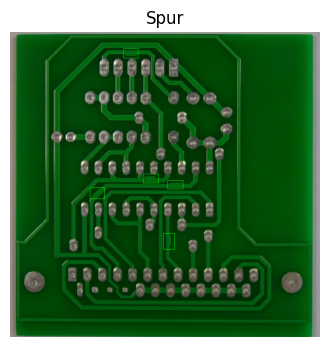

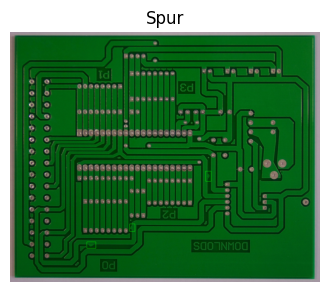


Showing samples from class: Spurious_copper


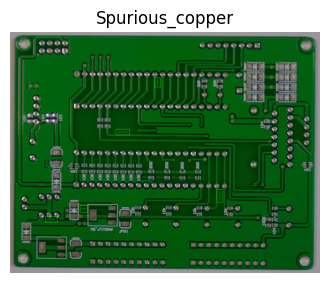

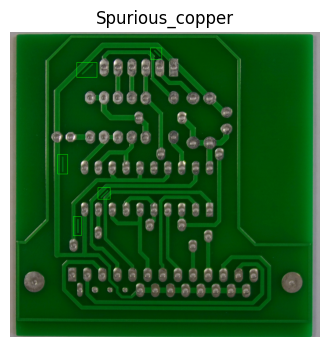

In [16]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import random

base_image_path = "PCB_DATASET/images"
base_annotation_path = "PCB_DATASET/Annotations"

classes = os.listdir(base_image_path)

for class_name in classes:
    print(f"\nShowing samples from class: {class_name}")

    image_folder = os.path.join(base_image_path, class_name)
    annotation_folder = os.path.join(base_annotation_path, class_name)

    image_files = os.listdir(image_folder)

    # Select 2 random images from each class
    sample_images = random.sample(image_files, 2)

    for sample_image in sample_images:
        img_path = os.path.join(image_folder, sample_image)
        img = cv2.imread(img_path)

        xml_file = sample_image.replace(".jpg", ".xml")
        xml_path = os.path.join(annotation_folder, xml_file)

        tree = ET.parse(xml_path)
        root = tree.getroot()

        for obj in root.findall("object"):
            bbox = obj.find("bndbox")

            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        plt.figure(figsize=(4,4))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name}")
        plt.axis("off")
        plt.show()



Showing samples from class: Open_circuit


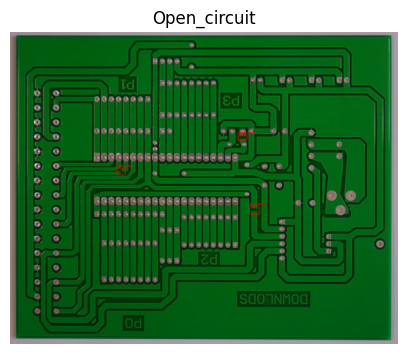

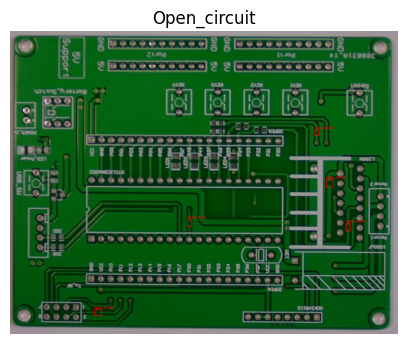


Showing samples from class: Missing_hole


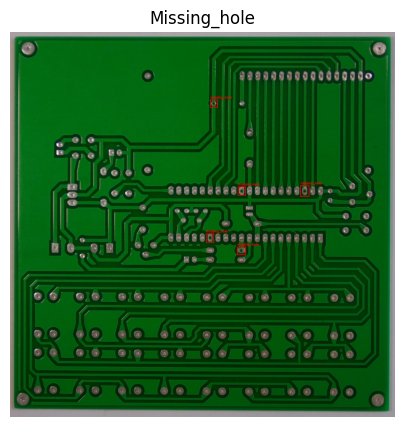

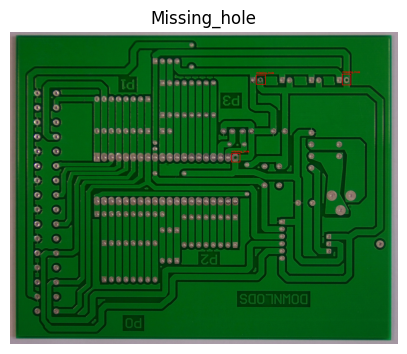


Showing samples from class: Mouse_bite


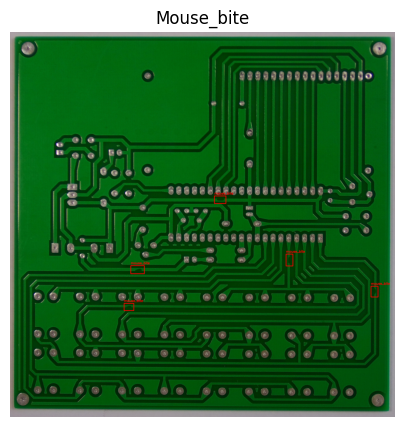

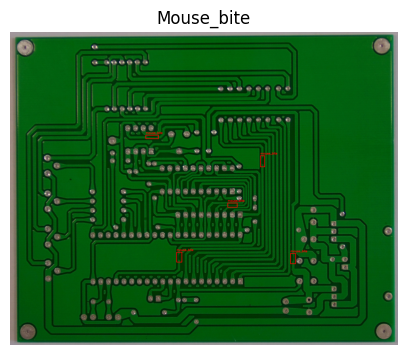


Showing samples from class: Short


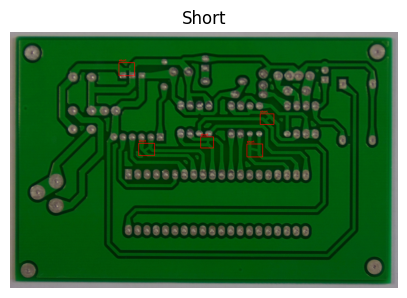

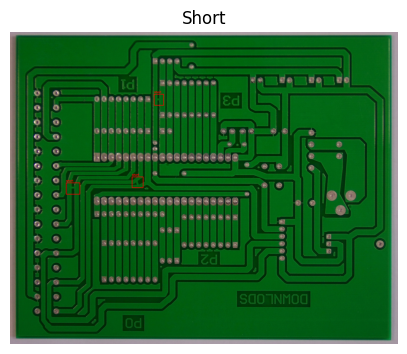


Showing samples from class: Spur


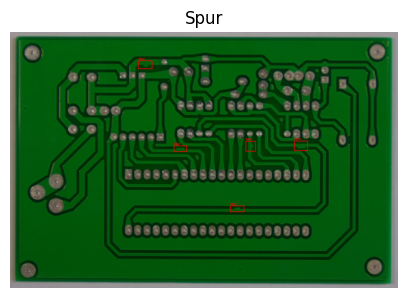

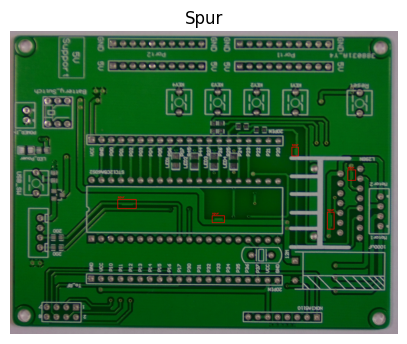


Showing samples from class: Spurious_copper


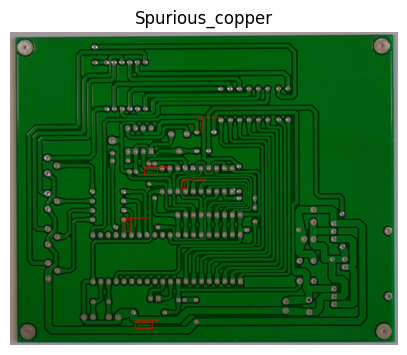

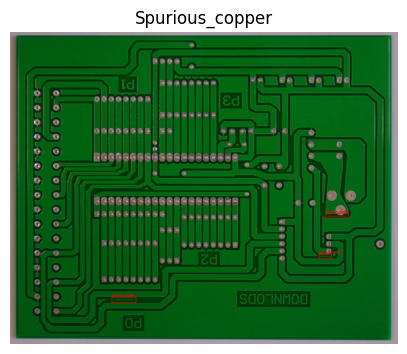

In [17]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import random

# Base dataset paths
base_image_path = "PCB_DATASET/images"
base_annotation_path = "PCB_DATASET/Annotations"

# Get all defect classes
classes = os.listdir(base_image_path)

for class_name in classes:
    print(f"\nShowing samples from class: {class_name}")

    image_folder = os.path.join(base_image_path, class_name)
    annotation_folder = os.path.join(base_annotation_path, class_name)

    image_files = os.listdir(image_folder)

    # Select 2 random images from each class
    sample_images = random.sample(image_files, 2)

    for sample_image in sample_images:

        # Read image
        img_path = os.path.join(image_folder, sample_image)
        img = cv2.imread(img_path)

        # Read corresponding XML annotation
        xml_file = sample_image.replace(".jpg", ".xml")
        xml_path = os.path.join(annotation_folder, xml_file)

        tree = ET.parse(xml_path)
        root = tree.getroot()

        for obj in root.findall("object"):
            defect_name = obj.find("name").text
            bbox = obj.find("bndbox")

            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            # Draw BRIGHT RED bounding box (thickness 4)
            cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 0, 255), 4)

            # Add defect label text
            cv2.putText(img, defect_name,
                        (xmin, ymin - 10),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.7,
                        (0, 0, 255),
                        2)

        # Show image
        plt.figure(figsize=(5,5))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name}")
        plt.axis("off")
        plt.show()



Showing samples from class: Open_circuit


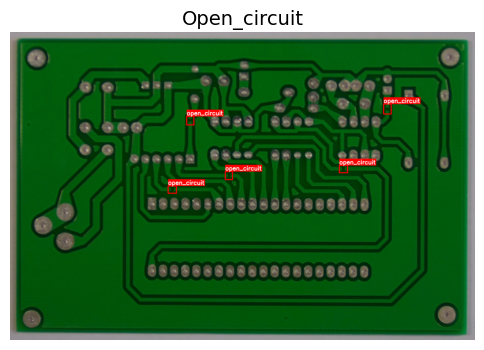

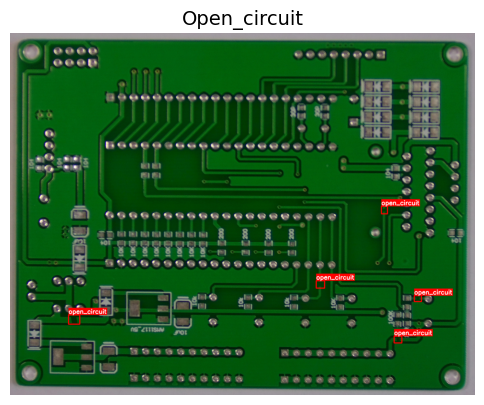


Showing samples from class: Missing_hole


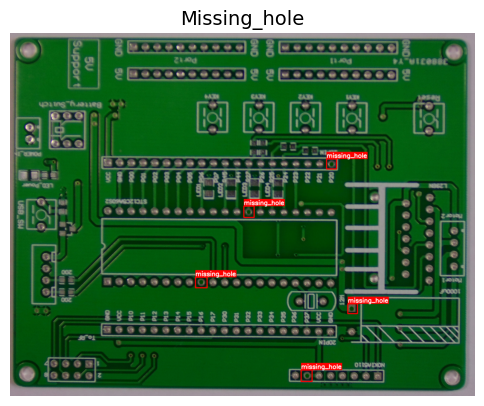

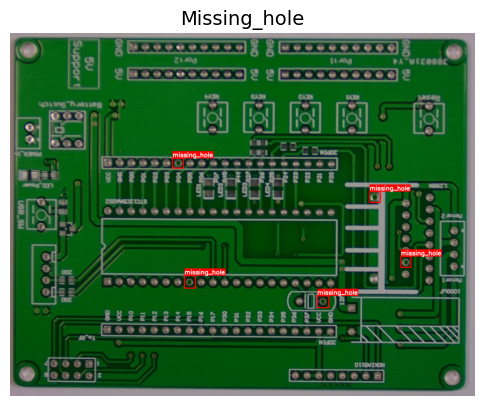


Showing samples from class: Mouse_bite


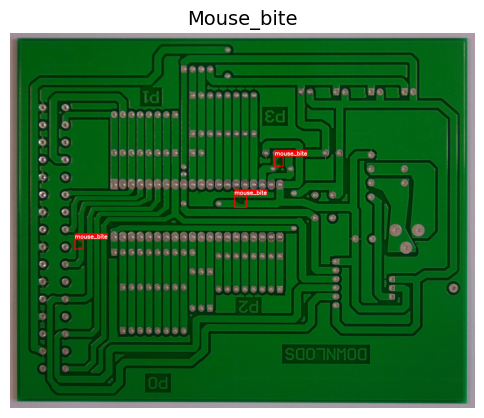

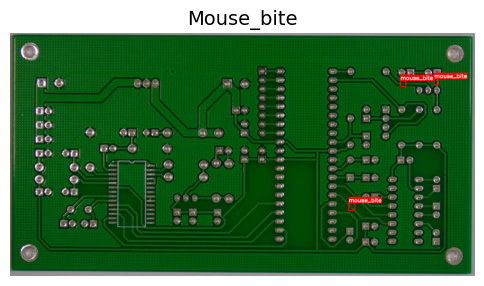


Showing samples from class: Short


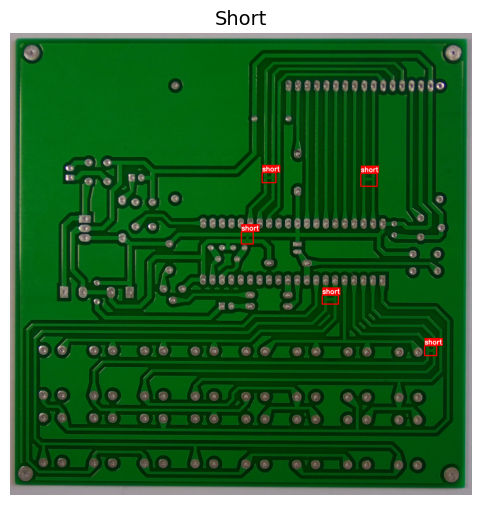

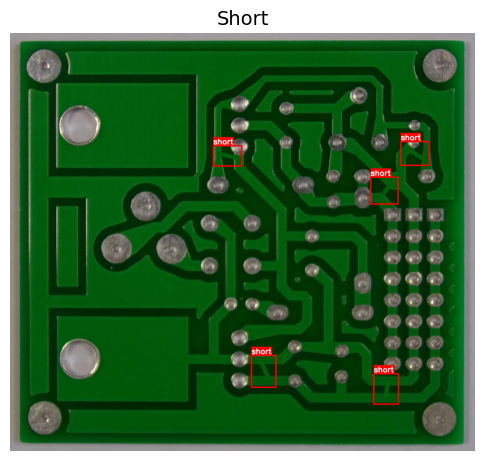


Showing samples from class: Spur


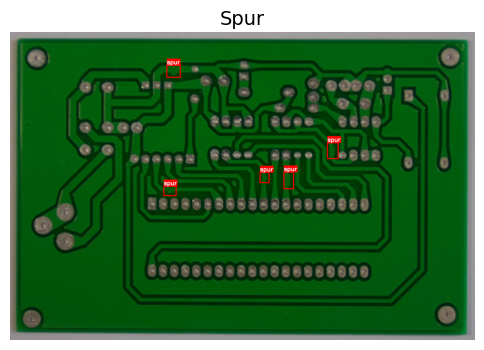

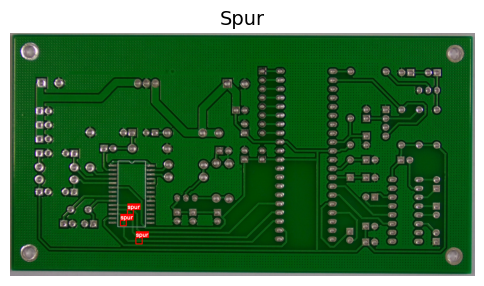


Showing samples from class: Spurious_copper


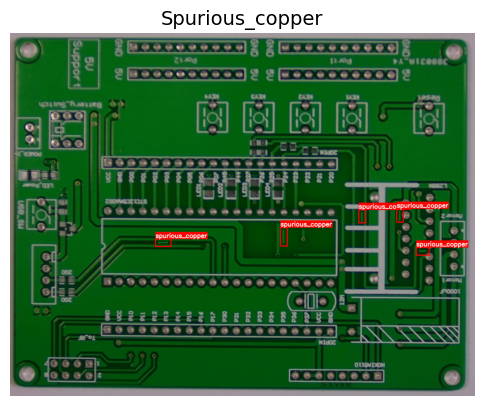

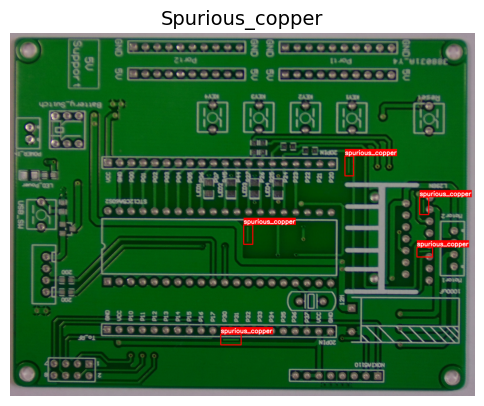

In [18]:
import os
import cv2
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import random

# Base dataset paths
base_image_path = "PCB_DATASET/images"
base_annotation_path = "PCB_DATASET/Annotations"

# Get all defect classes
classes = os.listdir(base_image_path)

for class_name in classes:
    print(f"\nShowing samples from class: {class_name}")

    image_folder = os.path.join(base_image_path, class_name)
    annotation_folder = os.path.join(base_annotation_path, class_name)

    image_files = os.listdir(image_folder)

    # Select 2 random images from each class
    sample_images = random.sample(image_files, 2)

    for sample_image in sample_images:

        # Read image
        img_path = os.path.join(image_folder, sample_image)
        img = cv2.imread(img_path)

        # Read XML annotation
        xml_file = sample_image.replace(".jpg", ".xml")
        xml_path = os.path.join(annotation_folder, xml_file)

        tree = ET.parse(xml_path)
        root = tree.getroot()

        for obj in root.findall("object"):
            defect_name = obj.find("name").text
            bbox = obj.find("bndbox")

            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            # Draw THICK bright RED bounding box
            cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 0, 255), 5)

            # Make text bigger
            font_scale = 1.2
            thickness = 3

            # Get text size
            (text_width, text_height), _ = cv2.getTextSize(
                defect_name,
                cv2.FONT_HERSHEY_SIMPLEX,
                font_scale,
                thickness
            )

            # Draw filled rectangle behind text (for visibility)
            cv2.rectangle(
                img,
                (xmin, ymin - text_height - 15),
                (xmin + text_width, ymin),
                (0, 0, 255),
                -1
            )

            # Put white text on red background
            cv2.putText(
                img,
                defect_name,
                (xmin, ymin - 8),
                cv2.FONT_HERSHEY_SIMPLEX,
                font_scale,
                (255, 255, 255),
                thickness
            )

        # Show image
        plt.figure(figsize=(6,6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{class_name}", fontsize=14)
        plt.axis("off")
        plt.show()


In [15]:
base_path = "PCB_DATASET/images"

for cls in os.listdir(base_path):
    cls_path = os.path.join(base_path, cls)
    print(cls, ":", len(os.listdir(cls_path)), "images")


Open_circuit : 116 images
Missing_hole : 115 images
Mouse_bite : 115 images
Short : 116 images
Spur : 115 images
Spurious_copper : 116 images
